In [1]:
import torch
import ChemSurrogate.data_processing as dp
from ChemSurrogate.configs import (
    DatasetConfig,
    AEConfig,
    EMConfig,
    )
import ChemSurrogate.analysis as analysis
from ChemSurrogate.trainer import (
    load_autoencoder_objects,
    load_emulator_objects,
    load_skipcon_emulator_objects,
    )
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
import pandas as pd
import os
import gc
import random
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


species_of_interest = ["H", "H2", "O", "C", "N", "SPlus", "MG", "SIPlus", "CL", "CPlus", "BULK_CO", "BULK_H", "E_minus", "CO", "BULK_CO"]
#species_of_interest = ["H", "H2", "O", "C", "N", "CL", "E_minus", "CO"]

In [2]:
# Load the models.
emulator, autoencoder, _, _ = load_skipcon_emulator_objects(is_inference=True)

# Load the datasets
training_t, training_indices = dp.load_tensors_from_hdf5(category="training")
validation_t, validation_indices = dp.load_tensors_from_hdf5(category="validation")

Loading Pretrained Model
Inference Mode Activated (parameters frozen)
Total Parameters: 280088


In [ ]:
left_index = DatasetConfig.num_metadata
right_index = DatasetConfig.num_metadata + DatasetConfig.num_physical_parameters
physical_parameters = training_t[:, left_index:right_index].numpy()
dp.inverse_physical_parameter_scaling(physical_parameters)

analysis.histogram_physical_parameters(
    sampled_physical_parameters=physical_parameters,
    savefig_path=None,
)

### This section is for obtaining the error plots across species and timesteps.

In [3]:
validation_Dataset = dp.RowRetrievalDataset(validation_t, validation_indices)
validation_dataloader = dp.tensor_to_dataloader(EMConfig, validation_Dataset, is_emulator=True)

num_timesteps = 100
num_species = DatasetConfig.num_species

total_count = torch.zeros(num_timesteps, dtype=torch.float32).to(device)

total_rel_error = torch.zeros(num_timesteps, num_species, dtype=torch.float32).to(device)
total_mace_error = torch.zeros(num_timesteps, dtype=torch.float32).to(device)
total_conservation_error = torch.zeros(num_timesteps, dtype=torch.float32).to(device)
with torch.no_grad():
    for features, targets in validation_dataloader:
        features = features.to(device)
        targets = targets.to(device)
        emulated_features = dp.emulator_inferencing(emulator, features, scale_components=False)
        decoded_features = dp.decoder_inferencing(autoencoder, emulated_features)
        
        unscaled_targets = dp.inverse_abundances_scaling(targets)
        
        conservation_error = analysis.calculate_conservation_error(unscaled_targets, decoded_features)
        relative_error = analysis.calculate_relative_error(decoded_features, unscaled_targets)
        mace_error = analysis.calculate_mace_error(decoded_features, unscaled_targets)
        
        timesteps = (features[:, 0] * num_timesteps).round().long() - 1
        timesteps_species = timesteps.unsqueeze(1).expand(-1, num_species)
        
        sample_count = torch.ones(features.size(0), dtype=torch.float32, device=device)
        total_count.scatter_add_(0, timesteps, sample_count)
                
        total_rel_error.scatter_add_(0, timesteps_species, relative_error)
        total_mace_error.scatter_add_(0, timesteps, mace_error)
        total_conservation_error.scatter_add_(0, timesteps, conservation_error)

mean_rel_error_timestep_species = torch.zeros_like(total_rel_error.cpu())
mean_rel_error_timestep_species = (
    total_rel_error.cpu() / total_count.cpu().unsqueeze(1)
)

mean_rel_error_across_species = mean_rel_error_timestep_species.mean(dim=1)
std_rel_error_timestep = mean_rel_error_timestep_species.std(dim=1)
mean_mace_error_timestep = total_mace_error.cpu() / total_count.cpu()
mean_conservation_error_timestep = total_conservation_error.cpu() / total_count.cpu()

Data_matrix Memory usage: 2712.402 MB
Index_pairs Memory usage: 1155.85 MB

Dataset Size: 2020000 | Index Pairs: 101000000



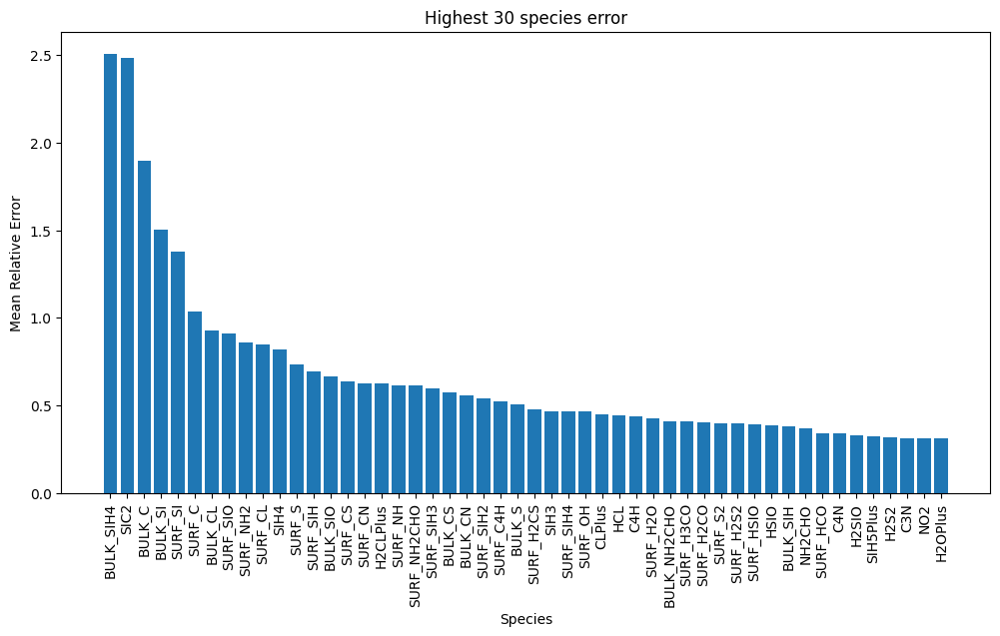

In [4]:
errors = mean_rel_error_timestep_species[:50].mean(axis=0).numpy().flatten()

species_errors = pd.DataFrame({'Species': DatasetConfig.species, 'Error': errors})

species_errors = species_errors.sort_values(by='Error', ascending=False).head(50)

plt.figure(figsize=(12, 6))
plt.bar(species_errors['Species'], species_errors['Error'])
plt.xlabel('Species')
plt.ylabel('Mean Relative Error')
plt.xticks(rotation=90)
plt.title('Highest 30 species error')
plt.show()


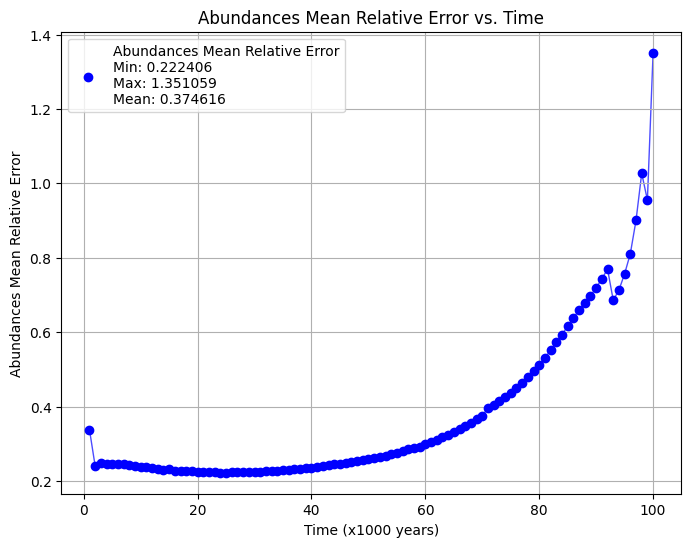

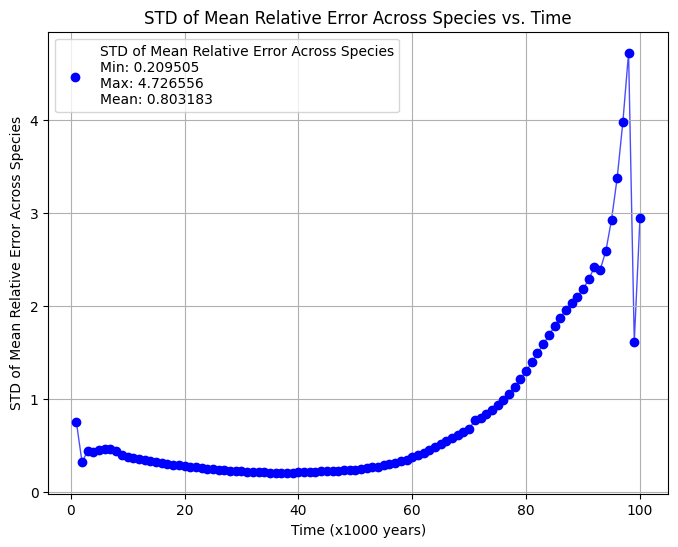

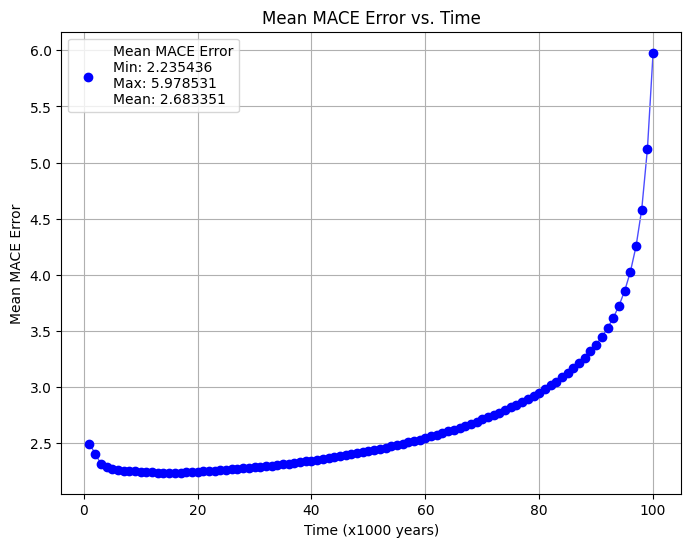

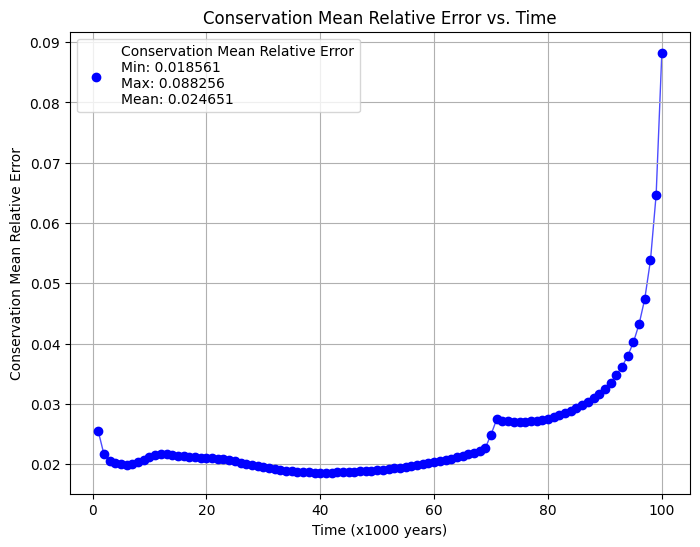

In [5]:
analysis.plot_error_vs_time(
    mean_rel_error_across_species,
    label = "Abundances Mean Relative Error",
    save_path = "plots/errors/mean_relative_errors.png"
    )
analysis.plot_error_vs_time(
    std_rel_error_timestep,
    label = "STD of Mean Relative Error Across Species",
    save_path = "plots/errors/std_relative_errors.png"
    )
analysis.plot_error_vs_time(
    mean_mace_error_timestep,
    label = "Mean MACE Error",
    save_path = "plots/errors/mace_errors.png"
    )
analysis.plot_error_vs_time(
    mean_conservation_error_timestep,
    label = "Conservation Mean Relative Error",
    save_path = "plots/errors/conservation_errors.png"
    )


# Abundances vs. Physical Parameters

In [ ]:
timestep = 90
filtered_t = training_t[training_t[:, 2] == timestep*1000][:, DatasetConfig.num_metadata:-AEConfig.latent_dim].numpy()
dp.inverse_physical_parameter_scaling(filtered_t[:, :DatasetConfig.num_physical_parameters])
dp.inverse_abundances_scaling_np(filtered_t[:, DatasetConfig.num_physical_parameters:])
training_df = pd.DataFrame(filtered_t, columns=DatasetConfig.physical_parameters + DatasetConfig.species)

In [ ]:
output_folder = "plots/actual_abundances_vs_physical_parameters"
analysis.scatter_abundances_vs_physical_parameters(
    df = training_df,
    species_of_interest = species_of_interest,
    output_folder = output_folder
    )

In [7]:
num_samples = 100000
timestep = 90
initial_conditions = analysis.sample_initial_conditions(num_samples)
initial_conditions_with_time = analysis.add_timesteps_to_conditions(initial_conditions, timestep)


with torch.no_grad():
    inputs = torch.from_numpy(initial_conditions_with_time).float()
        
    latent_components = dp.encoder_inferencing(autoencoder, inputs[:, -DatasetConfig.num_species:])
    
    encoded_features = torch.cat((inputs[:, :1+DatasetConfig.num_physical_parameters], latent_components.cpu()), dim=1)
        
    encoded_features = dp.emulator_inferencing(emulator, encoded_features)
    
    decoded_features = dp.decoder_inferencing(autoencoder, encoded_features).cpu().numpy()

results_df = analysis.reconstruct_results(initial_conditions_with_time, decoded_features)

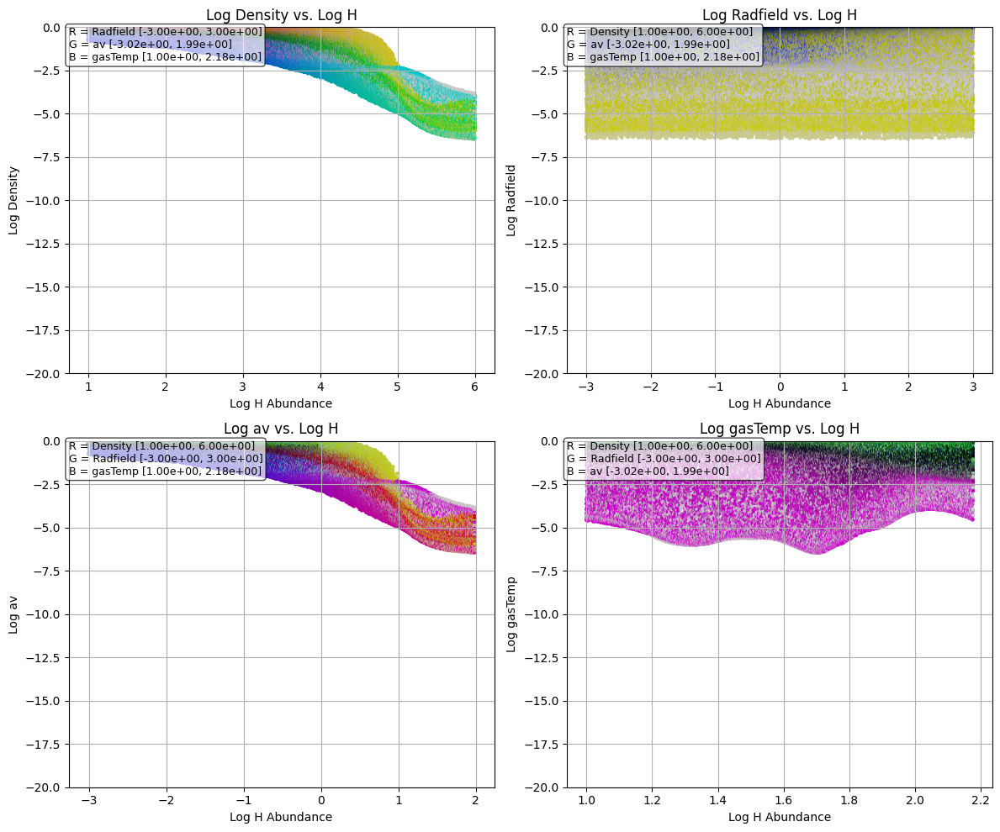

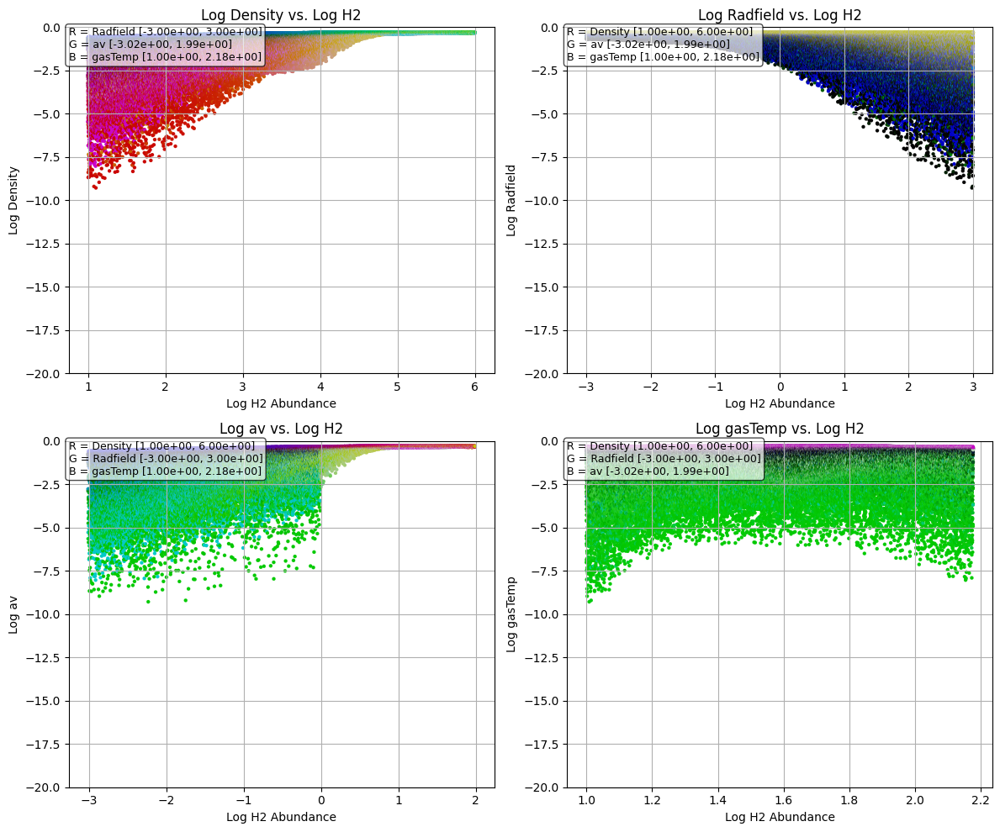

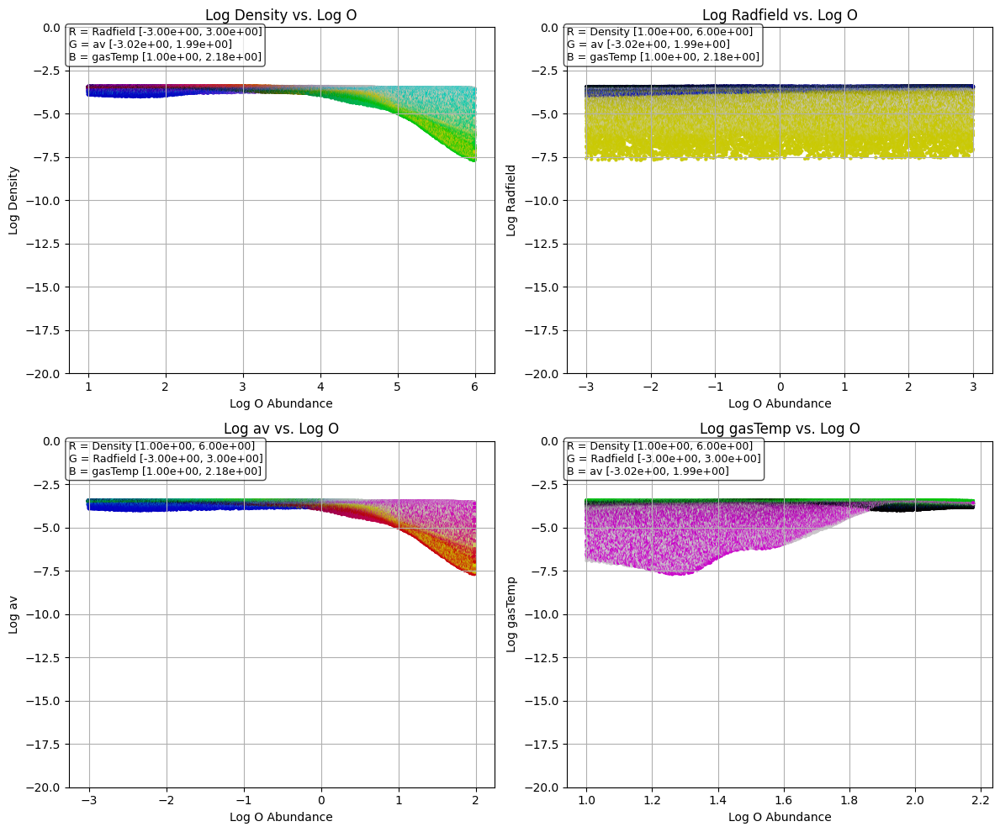

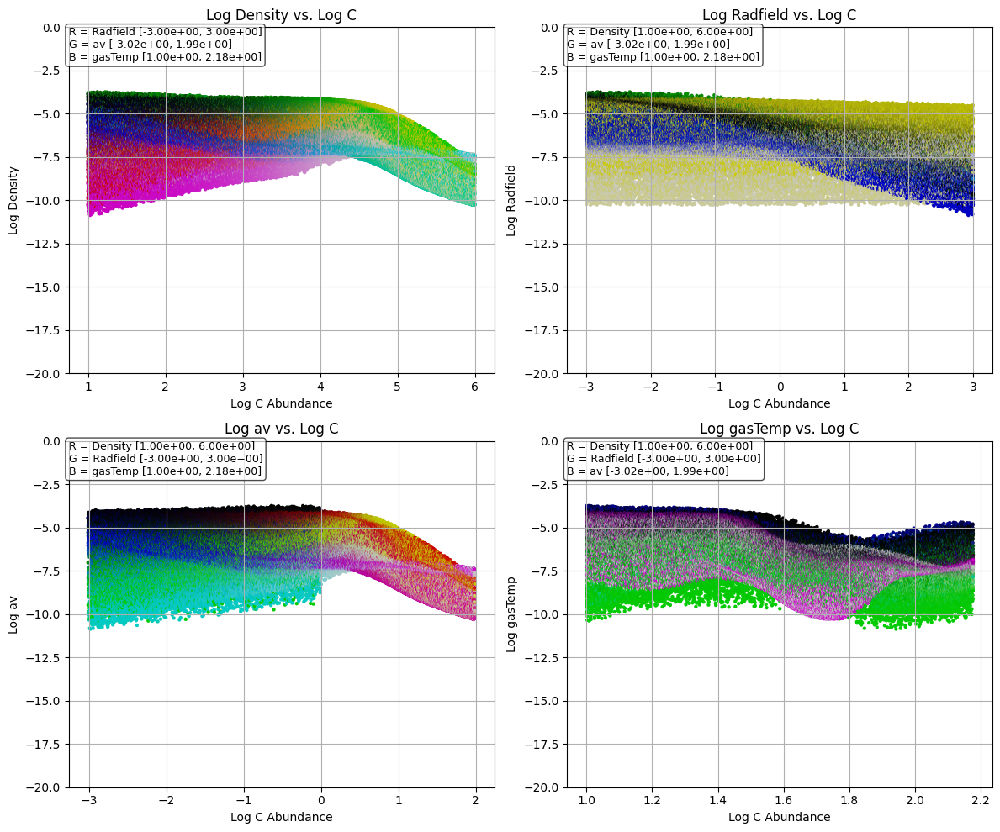

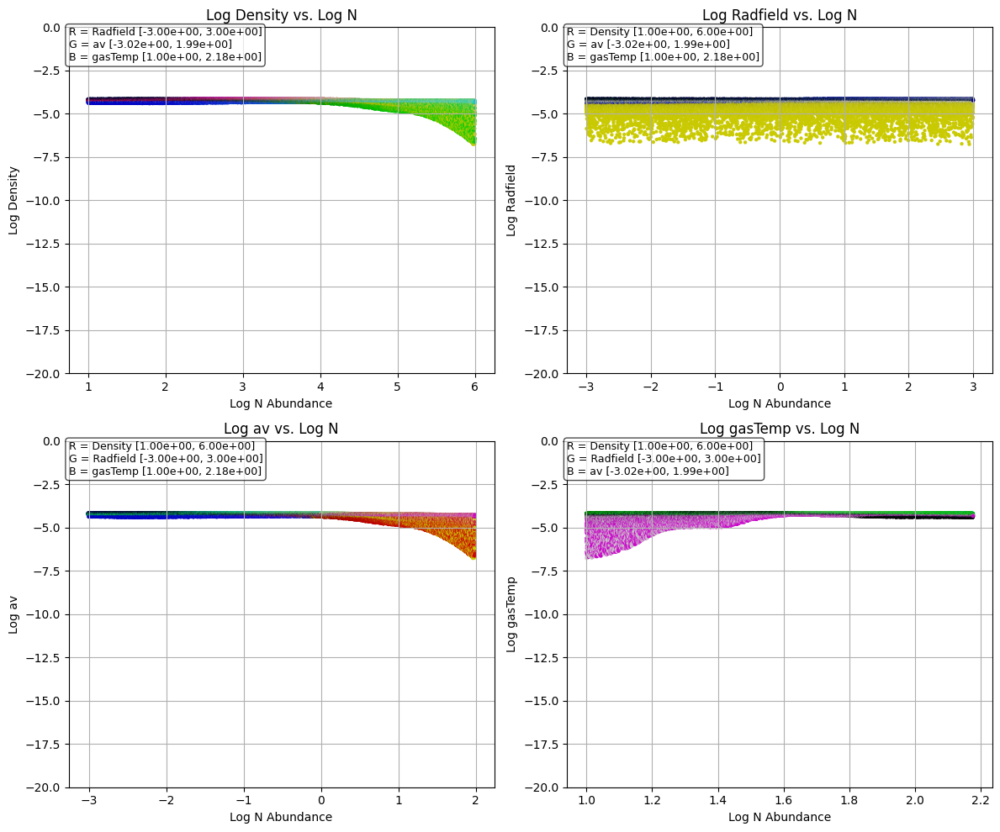

...

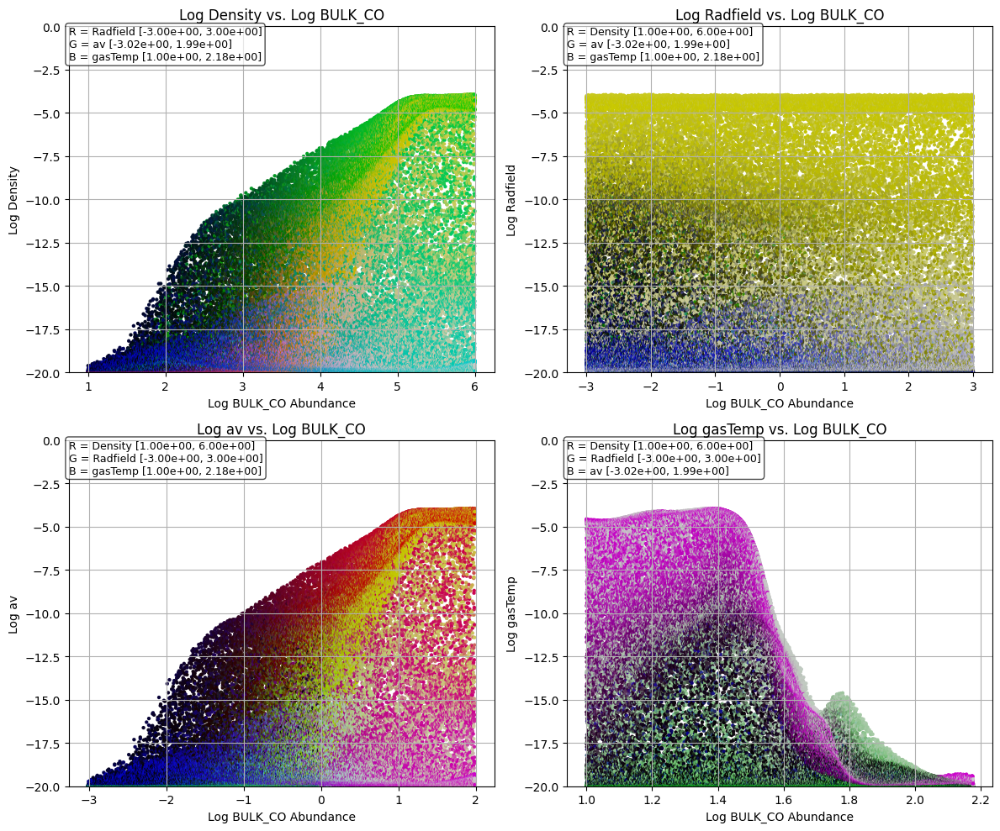

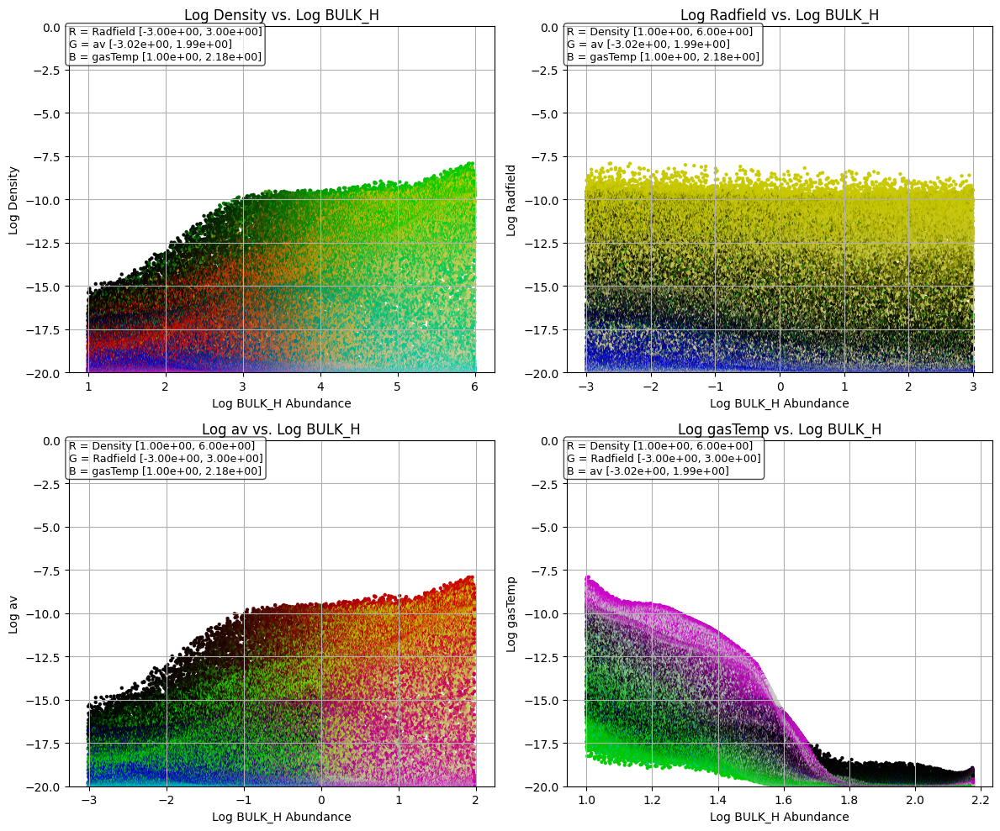

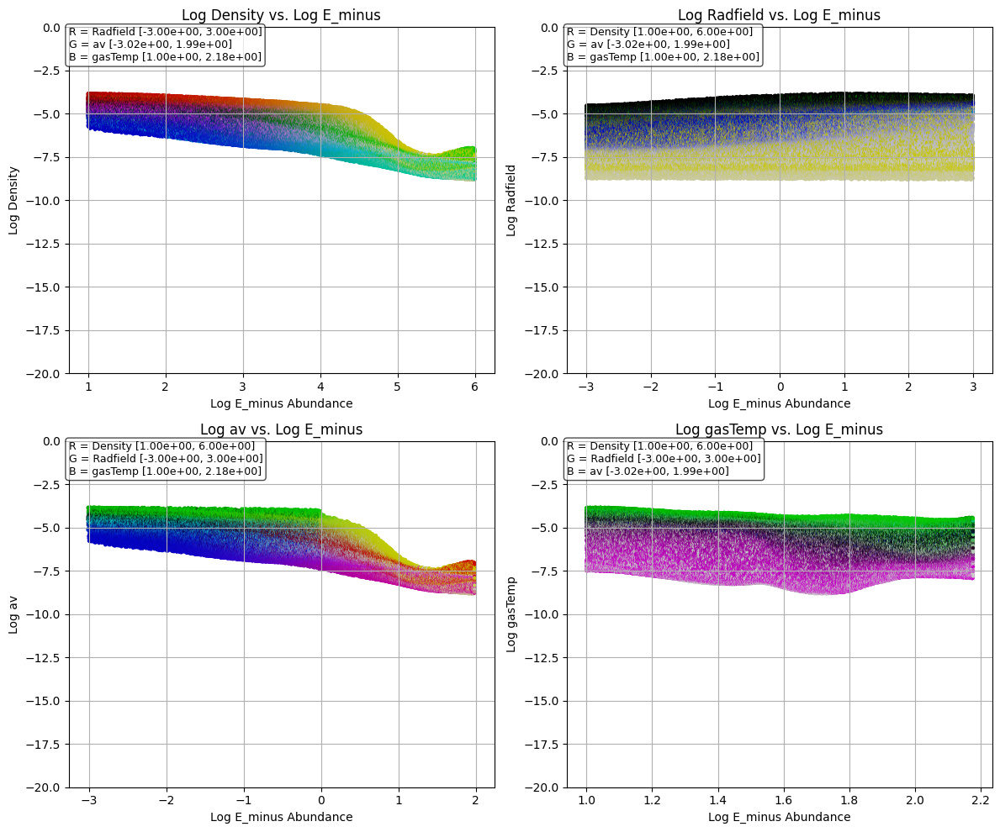

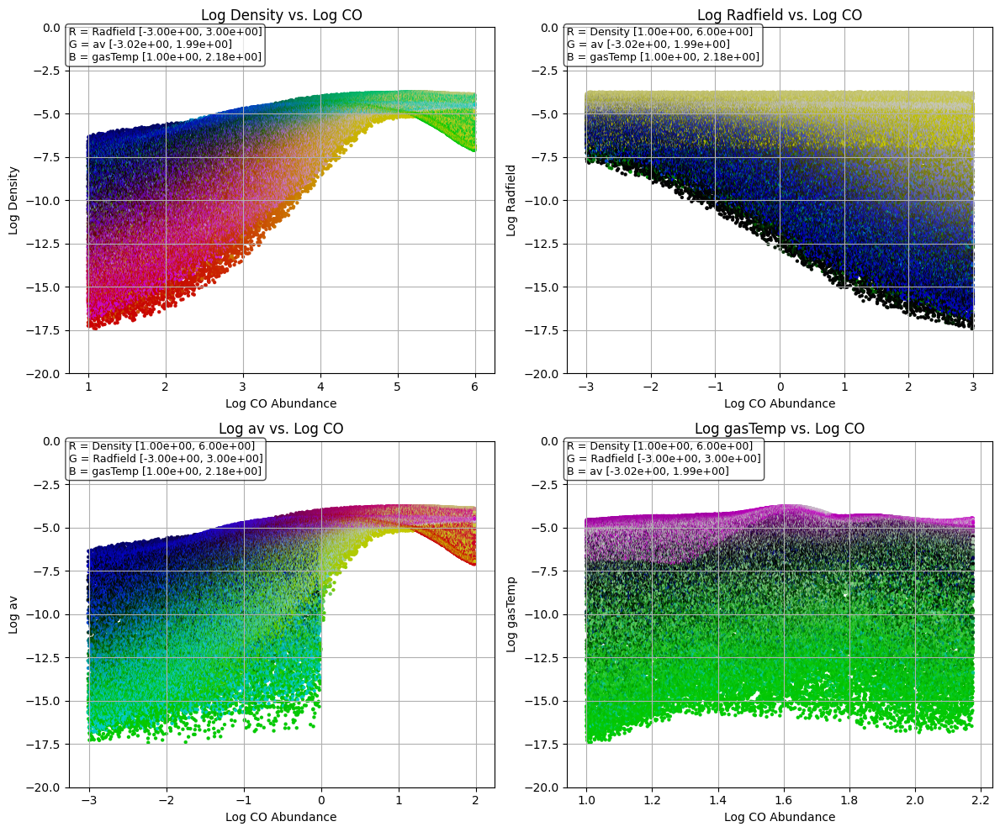

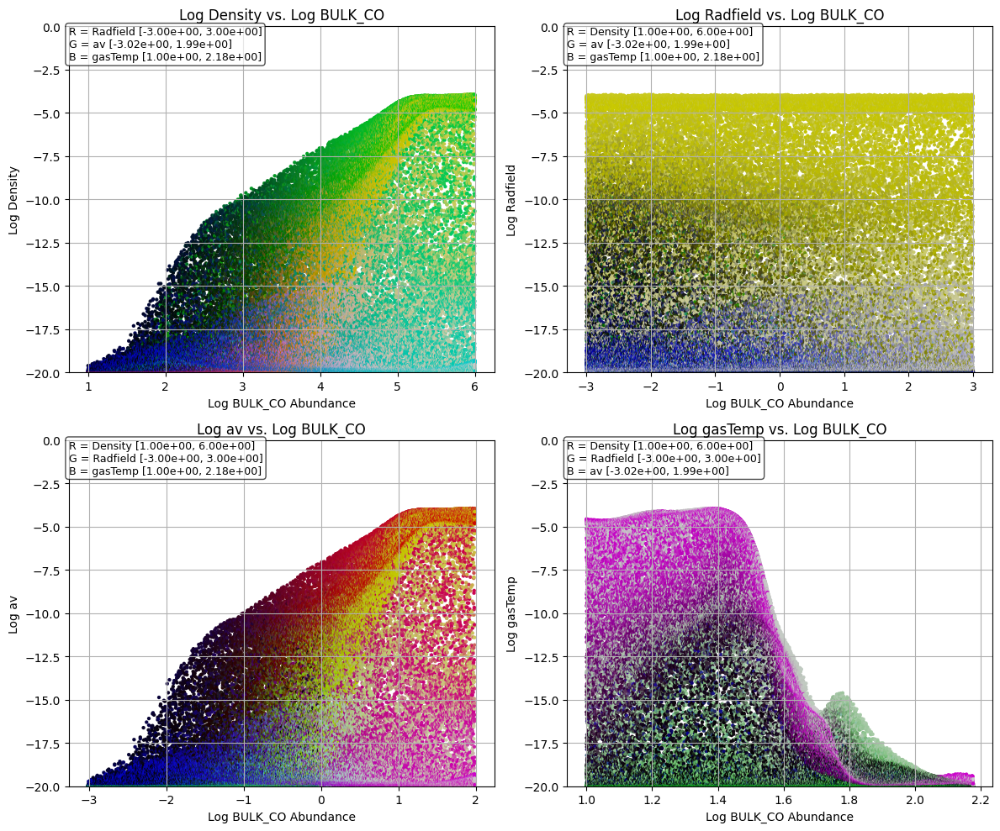

In [8]:
output_folder = "plots/predicted_abundances_vs_physical_parameters"
analysis.scatter_abundances_vs_physical_parameters(
    df = results_df,
    species_of_interest = species_of_interest,
    output_folder = output_folder
    )

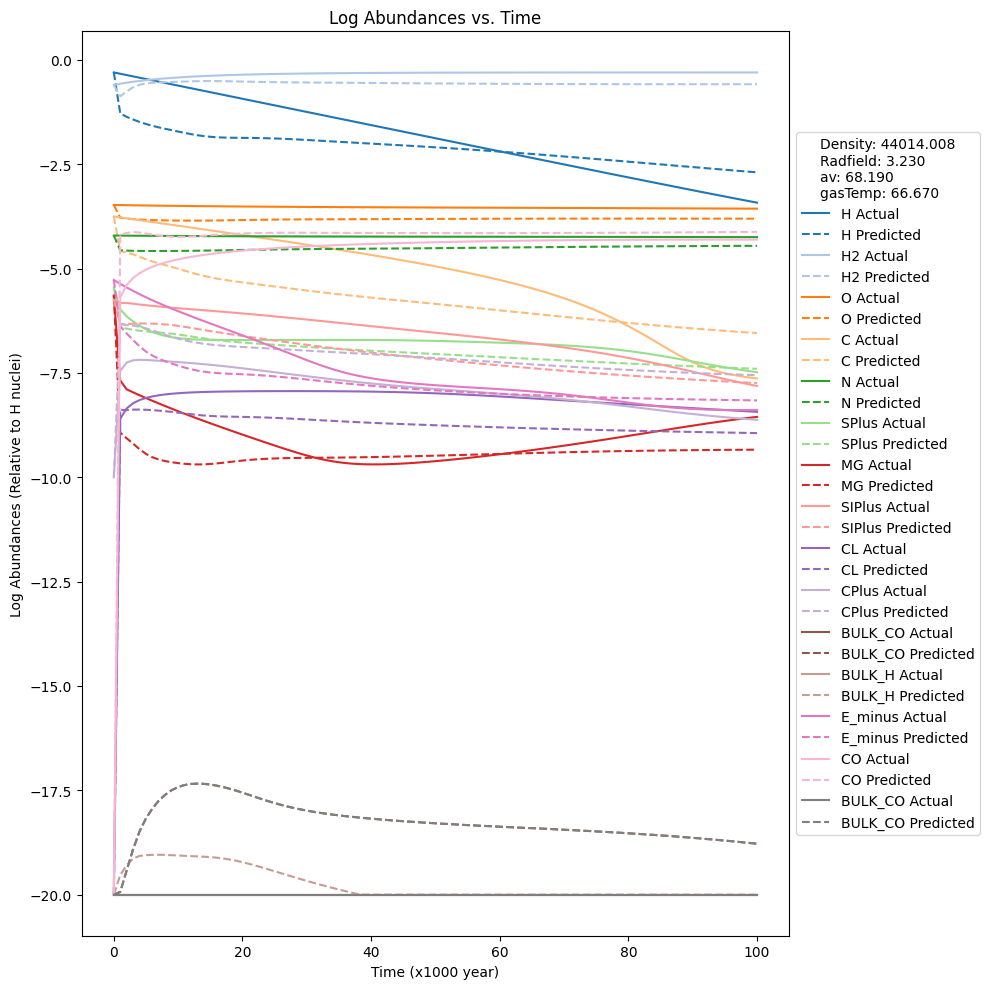

In [7]:
model_idx_num = 17005

model_idx = validation_t[:, 1].unique()[model_idx_num]
model_np = validation_t[validation_t[:, 1] == model_idx][:, 2:-AEConfig.latent_dim].numpy()

dp.inverse_abundances_scaling_np(model_np[:, 1+DatasetConfig.num_physical_parameters:])

initial_conditions = model_np[0, 1:][np.newaxis, :]
initial_conditions_with_time = analysis.add_multiple_timesteps_to_conditions(initial_conditions, num_timesteps=model_np.shape[0]-1)

with torch.no_grad():
    inputs = torch.from_numpy(initial_conditions_with_time).float()

    encoded_features = dp.encoder_inferencing(autoencoder, inputs[:, 1+DatasetConfig.num_physical_parameters:])
    
    encoded_features = torch.cat((inputs[:, :1+DatasetConfig.num_physical_parameters], encoded_features.cpu()), dim=1)
    
    encoded_features = dp.emulator_inferencing(emulator, encoded_features)
    
    decoded_features = dp.decoder_inferencing(autoencoder, encoded_features).cpu().numpy()

initial_abundances = initial_conditions[0, DatasetConfig.num_physical_parameters:]

decoded_features = np.vstack([initial_abundances, decoded_features])

results_df = analysis.reconstruct_results(model_np, decoded_features)

columns = DatasetConfig.physical_parameters + DatasetConfig.species
output_path = f"plots/abundances_vs_time/model_{int(model_idx)}.png"
analysis.plot_abundances_vs_time_comparison(
    actual = pd.DataFrame(model_np[:, 1:], columns=columns),
    predicted = results_df,
    species_of_interest=species_of_interest,
    output_path=output_path
)

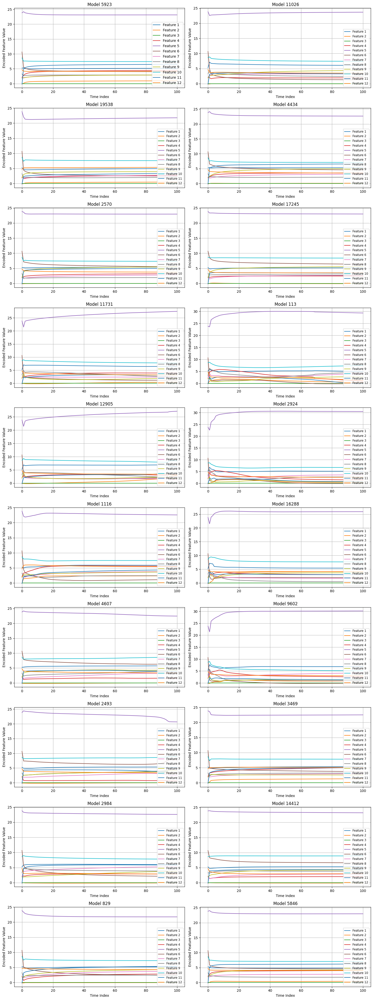

In [34]:
num_plots = 10 * 2
sampled_model_indices = random.sample(range(20000), num_plots)

fig, axes = plt.subplots(int(num_plots//2), 2, figsize=(15, num_plots*2))
axes = axes.flatten()

for plot_idx, model_idx_num in enumerate(sampled_model_indices):
    model_idx = validation_t[:, 1].unique()[model_idx_num]
    
    model_np = validation_t[validation_t[:, 1] == model_idx][:, 2:-AEConfig.latent_dim].numpy()
    
    abundances = model_np[:, 1+DatasetConfig.num_physical_parameters:]
    abundances_t = torch.from_numpy(abundances)
    
    with torch.no_grad():
        encoded_features = dp.encoder_inferencing(autoencoder, abundances_t)
    
    time_indices = (model_np[:, 0] / 1000)
    encoded_features_np = encoded_features.cpu().numpy()
    
    for i in range(encoded_features_np.shape[1]):
        axes[plot_idx].plot(time_indices, encoded_features_np[:, i], label=f'Feature {i+1}')
    
    axes[plot_idx].set_xlabel("Time Index")
    axes[plot_idx].set_ylabel("Encoded Feature Value")
    axes[plot_idx].set_title(f"Model {model_idx_num}")
    axes[plot_idx].grid(True)
    
    if plot_idx == 0:
        axes[plot_idx].legend(loc="lower right")
    else:
        axes[plot_idx].legend(loc="lower right", fontsize='small')

plt.tight_layout()
plt.show()